# Create a single-neuron, single-layer Neural Network using Numpy

In this article, you'll learn how to create a single-layer, single-neuron Neural Network using Numpy and explore how different parameters affect its training.

This tutorial aims to provide a clear understanding of the basic workings of neural networks.

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt

In [2]:
seed = 123
np.random.seed(seed)

In [3]:
folderpath = "plot/main/"
os.makedirs(folderpath, exist_ok=True)

## I. Model class

We are going to build a `SingleNeuronMLP` class, but first, we need to cover some mathematics.

### 1. Model definition

The model of a MLP with a single layer and a single neuron can be written as:

$$
\hat y_i = g(X_i \, W + b)
$$

Where:
* $X_i$ is the i-th individual from the dataset ($X$)
* $W$ are the weights of the model
* $b$ is the bias of the model
* $g$ is the activation function
* $\hat y_i$ is the prediction of the model

Let's note:

$$
X_i = \begin{pmatrix}
x^i_1 & x^i_2 & \ldots & x^i_n
\end{pmatrix}
$$


$$
W = \begin{pmatrix}
w_1\\
w_2\\
\ldots\\
w_n
\end{pmatrix}
$$

with $n$ the number of features in the dataset.

The model can be then written as:

$$
\hat y = g(w_1 \, x^i_1 + w_2 \, x^i_2 + \ldots + w_n \, x^i_n + b)
$$

In order to simplify the formula we can add the bias (we could call $w_0$) in the weights matrix:

$$
\tilde W = \begin{pmatrix}
b\\
w_1\\
w_2\\
\ldots\\
w_n
\end{pmatrix} = \begin{pmatrix}
w_0\\
w_1\\
w_2\\
\ldots\\
w_n
\end{pmatrix}
$$

Then we have to adapt $x$ by adding a $1$ at the begining (it will be multiplied by $w_0$):

$$
\tilde X_i = \begin{pmatrix}
1 & x^i_1 & x^i_2 & \ldots & x^i_n
\end{pmatrix}
$$

To finally get:

$$
\hat y_i = g(\tilde X_i \, \tilde W) = g(w_0 + w_1 \, x^i_1 + w_2 \, x^i_2 + \ldots + w_n \, x^i_n)
$$

and this, if we set the activation function at the linear function $g(x) = x$:

$$
\hat y_i = \tilde X_i \, \tilde W = w_0 + w_1 \, x^i_1 + w_2 \, x^i_2 + \ldots + w_n \, x^i_n
$$

### 2. Loss function

To let the model know if it's producing good outputs or not, we are going to choose a loss function.

In our case we are going to do a linear regression, then we will choose the very well known MSE:

$$
\text{MSE}(y, \hat y) = \frac{1}{N} \sum_{i=1}^{N} (y_i - \hat y_i)^2
$$

with 
* $y$ the actual values we want the model to predict ($y = (y_1, y_2, \ldots, y_N)$)
* $\hat y$ the predicted values ($\hat y = (\hat y_1, \hat y_2, \ldots, \hat y_N)$)
* $N$ the number of individuals in the dataset.

For a single individual we'll get:

$$
\text{MSE}(y_i, \hat y_i) = (y_i - \hat y_i)^2
$$

This measures the square of the prediction error.

The goal of the model is to minimize it in order to have $\hat y$ being as close as possible to the $y$ values.

This brings us to the Optimization part of the MLP process.

### 3. Optimizer

We have defined the model structure and the method to evaluate its outputs. Now, we need to determine how the model will learn from the inputs.

To do so, we will use an optimizer, which works alongside backpropagation to update the weights in the model. 

The most common method for updating the weights is stochastic gradient descent (SGD), which updates the weights by subtracting a fraction of the gradient of the loss function from them.

In our case the loss function is the MSE, the gradient is then computed as follows:


$$
\begin{align*}
\nabla \text{MSE}_{\tilde W} & = \nabla \frac{1}{N} \sum_{i=1}^{N} (y_i - \hat y_i)^2\\
                    & = \nabla \frac{1}{N} \sum_{i=1}^{N} (y_i - w_0 + \sum_{j=1}^{n} w_j \, x^i_j)^2\\
                    \begin{pmatrix}
  \dfrac{\partial \text{MSE}}{\partial w_0}\\
  \dfrac{\partial \text{MSE}}{\partial w_1}\\
  \dfrac{\partial \text{MSE}}{\partial w_2}\\
  \vdots\\
  \dfrac{\partial \text{MSE}}{\partial w_n}
                      \end{pmatrix} & = \begin{pmatrix}
  \frac{1}{N} \sum_{i=1}^{N} -2 \, (y_i - w_0 + \sum_{j=1}^{n} w_j \, x^i_j)\\
  \frac{1}{N} \sum_{i=1}^{N} -2 \, x^i_1 \, (y_i - w_0 + \sum_{j=1}^{n} w_j \, x^i_j) \\
  \frac{1}{N} \sum_{i=1}^{N} -2 \, x^i_2 \, (y_i - w_0 + \sum_{j=1}^{n} w_j \, x^i_j) \\
  \vdots\\
  \frac{1}{N} \sum_{i=1}^{N} -2 \, x^i_n \, (y_i - w_0 + \sum_{j=1}^{n} w_j \, x^i_j)
                                       \end{pmatrix}
\end{align*}
$$

We can easily write it using algebra:

$$
\nabla \text{MSE}_{\tilde W} = -\frac{2}{N} \tilde X^T (y - \tilde X \, \tilde W) = \frac{2}{N} \tilde X^T (\tilde X \, \tilde W - y)
$$

(You could have got this version: $\frac{2}{N} \tilde X^T (\tilde X \, \tilde W - y)$ by switching $y$ and $\hat y$ in the MSE function)

That's it, we can now update the weights of our model and enables it to learn:

$$
\begin{align*}
\tilde W^{\text{new}} & = \tilde W^{\text{old}} - \eta \, \nabla \text{MSE}_{\tilde W^{\text{old}}}\\
 & = \tilde W^{\text{old}} - \eta \, \frac{2}{N} \tilde X^T (\tilde X \, \tilde W^{\text{old}} - y)
\end{align*}
$$

with $\eta$ the learning rate that enables to keeps a fraction of the gradient to update the weights with more or less strength.

Something to keep in mind is that setting this parameter too high can cause the algorithm to diverge but setting it too low makes it slow to converge. That's why there are a lot of optimizers that performs usually better, they work without this parameter to be set.

Now we can finally code!

### 4. Python Class

Let's process step by step.

We first introduced **the model** and how to do predictions:

```python
def predict_outputs(self, inputs):
    net_input = inputs@self.weights
    return self.activation_function(net_input).flatten()
```

* `inputs` is an individual or a batch of training examples
* `weights` are defined when calling the `fit` function:

```python
self.weights = np.random.uniform(low=-0.5, high=0.5, size=(inputs.shape[1],1))
```

* `activation_function` is defined when creating an instance of the class:

```python
@staticmethod
def get_activation_function(name="ReLU"):
    names = ["ReLU", "linear", "sigmoid"]
    if name == "ReLU":
        return lambda x: np.maximum(x, 0)
    elif name == "linear":
        return lambda x: x
    elif name == "sigmoid":
        return lambda x: 1/(1 + np.exp(-x))
    else:
        raise ValueError(f'Error: name must be one of {names}')
```

Then we introduced the loss function:

```python
@staticmethod
def get_loss_function(name="mean_squared_error"):
    names = ["mean_squared_error", "mean_absolute_error"]
    if name == "mean_squared_error":
        return lambda y, y_pred: np.mean((y - y_pred)**2)
    elif name == "mean_absolute_error":
        return lambda y, y_pred: np.mean(np.abs(y - y_pred))
    else:
        raise ValueError(f'Error: name must be one of {names}')
```

And finally, the optimizer which compute a gradient according to the chosen loss function and update the weights using a fraction of it.

Here's the function to get the gradient:

```python
@staticmethod
def get_gradient(inputs, targets, weights, loss):
    names = ["mean_squared_error", "mean_absolute_error"]
    if loss == "mean_squared_error":
        delta = 2/inputs.shape[0] * inputs.T@(inputs@weights - targets.reshape(-1, 1))
    elif loss == "mean_absolute_error":
        delta = np.mean(inputs * np.sign(inputs@weights - targets.reshape(-1, 1)), axis=0)
    else:
        raise ValueError(f'Error: loss must be one of {names}')
    return delta
```

* `targets` is a target value or a batch of target values ($y_i$ or $y_\text{batch}$)

and the function updating the weights:

```python
def _update_weights(self, batch_inputs, batch_targets):
    grad = self.get_gradient(batch_inputs, batch_targets, self.weights, self.loss)
    if self.optimizer_name == "SGD":
        self.weights = self.weights - self.learning_rate*grad.reshape(grad.shape[0],1)

```

There are others function in order to manage the training part, such as: manage batches, one step of the training process, save results, display current state of the training. 

Here's a simplified version of the training part you'll find in the `fit` function in the class below:

```python
format_inputs # add a 1 at the begining of each training example
init_weights
manage_batch
for epoch in epochs:
    for batch in batches:
        y_pred_batch = self.predict_outputs(X[batch])
        batch_outputs_loss = self.loss_function(y[batch], y_pred_batch)
        self._update_weights(X[batch], y[batch])
```

You can make this class being simpler or more complex depending on your need, and of course, you can simply use well know and optimized libraries such as **tensorflow**.

But here, the only goal is to understand how it works. Here's the full code of the class:

In [4]:
class SingleNeuronMLP():
    def __init__(self, learning_rate=0.01, activation="ReLU"):
        self.activation_function = self.get_activation_function(name=activation)
        self.learning_rate = learning_rate
        self.loss = None
        self.loss_function = None
        self.optimizer_name = None
        self.weights = None
        self.training_results = dict()
    
    @staticmethod
    def get_activation_function(name="ReLU"):
        names = ["ReLU", "linear", "sigmoid"]
        if name == "ReLU":
            return lambda x: np.maximum(x, 0)
        elif name == "linear":
            return lambda x: x
        elif name == "sigmoid":
            return lambda x: 1/(1 + np.exp(-x))
        else:
            raise ValueError(f'Error: name must be one of {names}')

    @staticmethod
    def batch_manager(inputs, batch_size=32):
        n = inputs.shape[0]
        if batch_size < 1:
            raise ValueError('Error: batch_size must be > 0.')
        n_batch = n // batch_size
        indexes = np.random.choice(range(n), size=n, replace=False)
        if n % batch_size != 0:
            n_batch += 1
        if n_batch <= 1:
            n_batch = 1
        return indexes, n_batch

    @staticmethod
    def get_loss_function(name="mean_squared_error"):
        names = ["mean_squared_error", "mean_absolute_error"]
        if name == "mean_squared_error":
            return lambda y, y_pred: np.mean((y - y_pred)**2)
        elif name == "mean_absolute_error":
            return lambda y, y_pred: np.mean(np.abs(y - y_pred))
        else:
            raise ValueError(f'Error: name must be one of {names}')
    
    def compile(self, loss="mean_squared_error", optimizer="SGD"):
        self.loss = loss
        self.loss_function = self.get_loss_function(loss)
        self.optimizer_name = optimizer
        
    @staticmethod
    def get_gradient(inputs, targets, weights, loss):
        names = ["mean_squared_error", "mean_absolute_error"]
        if loss == "mean_squared_error":
            delta = 2/inputs.shape[0] * inputs.T@(inputs@weights - targets.reshape(-1, 1))
        elif loss == "mean_absolute_error":
            delta = np.mean(inputs * np.sign(inputs@weights - targets.reshape(-1, 1)), axis=0)
        else:
            raise ValueError(f'Error: loss must be one of {names}')
        return delta
    
    def _update_weights(self, batch_inputs, batch_targets):
        grad = self.get_gradient(batch_inputs, batch_targets, self.weights, self.loss)
        if self.optimizer_name == "SGD":
            self.weights = self.weights - self.learning_rate*grad.reshape(grad.shape[0],1)
        
    def predict_outputs(self, inputs):
        net_input = inputs@self.weights
        return self.activation_function(net_input).flatten()

    def train_one_step(self, batch_inputs, batch_targets):
        batch_outputs = self.predict_outputs(batch_inputs)
        batch_outputs_loss = self.loss_function(batch_targets, batch_outputs)
        self._update_weights(batch_inputs, batch_targets)
        return batch_outputs, batch_outputs_loss

    def fit(self, X, y, validation_data=None, epochs=10, batch_size=32, batch_details=False, random_state=None, verbose=0):
        inputs = X.copy()
        targets = y.copy()
        if not(random_state is None):
            np.random.seed(random_state)
        # format inputs
        inputs = np.c_[np.ones((inputs.shape[0],1)), inputs]
        # init weights
        self.weights = np.random.uniform(low=-0.5, high=0.5, size=(inputs.shape[1],1))
        self.training_results["weights_init"] = self.weights
        # manage batches
        indexes, n_batch = self.batch_manager(inputs, batch_size=batch_size)
        # training
        losses_list, score_list, val_score_list, weights_list = [], [], [], []
        batch_indexes_list, batch_weights_list = [], []
        for epoch in range(epochs):
            batch_losses, batch_indexes, batch_weights = [], [], []
            for i in range(n_batch):
                index = indexes[i*batch_size:(i+1)*batch_size]
                batch_inputs = inputs[index,:]
                batch_targets = targets[index]
                #
                batch_outputs, batch_outputs_loss = self.train_one_step(batch_inputs, batch_targets)
                batch_losses.append(batch_outputs_loss)
                if batch_details:
                    batch_indexes.append(index)
                    batch_weights.append(self.weights)
                if verbose > 0:
                    print(f"\rEpoch {epoch+1}/{epochs} - {i+1}/{n_batch} - loss={np.mean(batch_losses)}", end="")
            # save for training results
            epoch_loss = np.mean(batch_losses)
            losses_list.append(epoch_loss)
            epoch_score = self.evaluate(X, y)
            score_list.append(epoch_score)
            weights_list.append(self.weights)
            if batch_details:
                batch_indexes_list.append(batch_indexes)
                batch_weights_list.append(batch_weights)
            # evaluation on validation data if provided
            if not(validation_data is None):
                val_score = self.evaluate(validation_data[0], validation_data[1])
                val_score_list.append(val_score)
                if verbose > 1:
                    print(f"\rEpoch {epoch+1}/{epochs} - {n_batch}/{n_batch} - loss={epoch_loss} - score={epoch_score}, val_score={val_score}")
                elif verbose == 1:
                    print(f"\rEpoch {epoch+1}/{epochs} - {n_batch}/{n_batch} - loss={epoch_loss} - score={epoch_score}, val_score={val_score}", end="")
            else: 
                if verbose > 1:
                    print(f"\rEpoch {epoch+1}/{epochs} - {n_batch}/{n_batch} - loss={epoch_loss} - score={epoch_score}")
                elif verbose == 1:
                    print(f"\rEpoch {epoch+1}/{epochs} - {n_batch}/{n_batch} - loss={epoch_loss} - score={epoch_score}", end="")
        # training results
        self.training_results["losses"] = losses_list
        self.training_results["scores"] = score_list
        self.training_results["weights"] = weights_list
        if batch_details:
            self.training_results["batch_weights"] = batch_weights_list
            self.training_results["batch_indexes"] = batch_indexes_list
        if not(validation_data is None):
            self.training_results["val_scores"] = val_score_list

    def predict(self, new_inputs):
        new_inputs = np.c_[np.ones((new_inputs.shape[0],1)), new_inputs]
        outputs = self.predict_outputs(new_inputs)
        return outputs

    def evaluate(self, inputs, targets):
        inputs = np.c_[np.ones((inputs.shape[0],1)), inputs]
        outputs = self.predict_outputs(inputs)
        score = self.loss_function(targets, outputs)
        return score

## II. Simple regression task

I have chosen to first generate a simple dataset with one variable and one target.

And as the model is a single neuron, we are going to have only 2 parameters: the bias and the weight corresponding to the connection between the variable and the neuron.

The model is then a simple linear regressor.

Here is the function we want the model to find:

In [5]:
def f(x):
    return 3*x + 1

A task you could try after understanding this tutorial is to train a model on a dataset with more than one variable (you won't need to modify this class).

Another one could be to add neurons and then creating a single layer MLP (you'll need to modify this class).

### 1. Generate data and fit a model

I generate 1000 random values for $X$ and compute the targets $y$ using the $f$ function plus a little noise to make it more real.

In [6]:
n_individuals, m_features = 1000, 1
X = np.random.normal(10, 1, size=(n_individuals, m_features))

y = f(X).flatten()
noise = np.random.normal(0, 0.5, size=n_individuals)
y += noise

Let's plot this dataset:

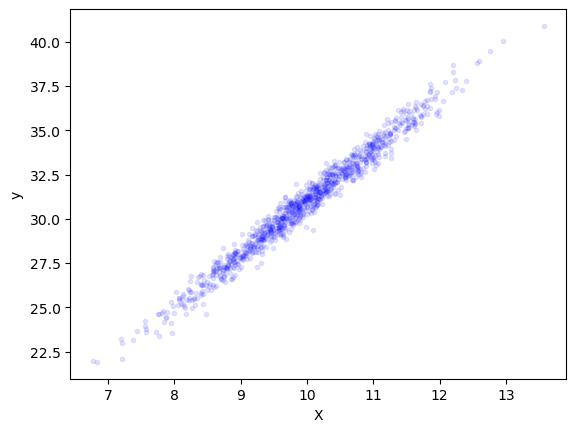

In [7]:
plt.plot(X[:,0], y, "b.", alpha=0.1)
plt.xlabel("X")
plt.ylabel("y")
plt.savefig(f'{folderpath}dataset.png')
plt.show()

In order to fit a neural network on these data, we are going to normalize them.

It's recommended to normalize them either to the range [0, 1] or to the range [-1, 1].

Let's normalize them to the [0, 1] range, this corresponds to the min-max normalization method by the way.

In [8]:
min_values = X.min(axis=0)
max_values = X.max(axis=0)
print("min_values:", min_values.tolist(), "\nmax_values:", max_values.tolist())

min_values: [6.768944992080687] 
max_values: [13.571579218026312]


In [9]:
X_normalized = (X - min_values)/(max_values - min_values)

Now, we can simply train the model:

In [10]:
model = SingleNeuronMLP(learning_rate=0.01, activation="linear")
model.compile(loss="mean_squared_error")
model.fit(X_normalized, y, epochs=100, batch_size=32, random_state=seed, verbose=2)

Epoch 1/100 - 32/32 - loss=493.3559402926216 - score=197.0494259562299
Epoch 2/100 - 32/32 - loss=102.27399588256672 - score=41.639154365992425
Epoch 3/100 - 32/32 - loss=22.278769326062747 - score=9.84234043638291
Epoch 4/100 - 32/32 - loss=5.881410765394108 - score=3.3127356180185306
Epoch 5/100 - 32/32 - loss=2.494052515380032 - score=1.950406303700247
Epoch 6/100 - 32/32 - loss=1.772011924275327 - score=1.6462010753412697
Epoch 7/100 - 32/32 - loss=1.5979892309598827 - score=1.5595357562933072
Epoch 8/100 - 32/32 - loss=1.5377618631542092 - score=1.5182127276281225
Epoch 9/100 - 32/32 - loss=1.501887283478414 - score=1.4868402265163914
Epoch 10/100 - 32/32 - loss=1.4717626538964492 - score=1.4580864136815286
Epoch 11/100 - 32/32 - loss=1.443434386125316 - score=1.4304014182694982
Epoch 12/100 - 32/32 - loss=1.416020303047955 - score=1.403438995076238
Epoch 13/100 - 32/32 - loss=1.3893008651892602 - score=1.377109073253288
Epoch 14/100 - 32/32 - loss=1.3632077357050274 - score=1.351

During the first steps of the training, the model got a loss greater than 1.

The loss decreased quickly and ends up slowy to 0.39 at the $100^\text{th}$ epoch.

Let's see these values on a chart:

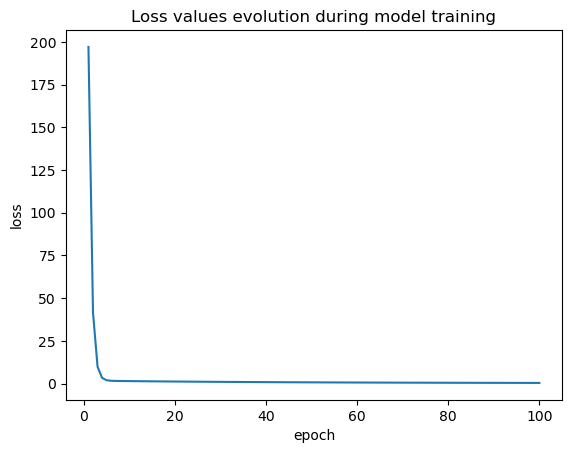

In [11]:
plt.plot(range(1,100+1), model.training_results["scores"])
plt.xlabel("epoch")
plt.ylabel("loss")
plt.title("Loss values evolution during model training")
plt.savefig(f'{folderpath}default_model_training_loss.png')
plt.show()

The model is learning really fast at the begining but then suddenly stop learning. 

Let's plot the predictions of the model:

In [12]:
y_pred = model.predict(X_normalized)

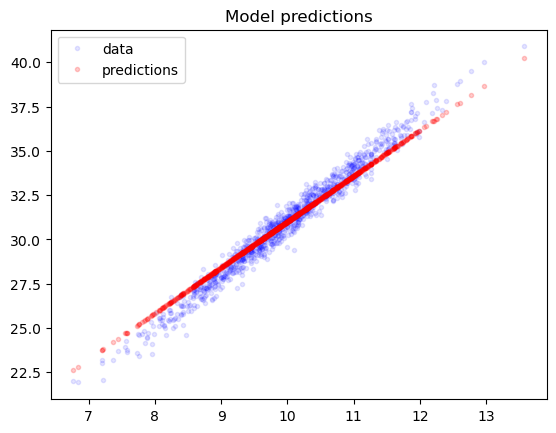

In [13]:
plt.plot(X[:,0], y, "b.", alpha=0.1, label="data")
plt.plot(X[:,0], y_pred, "r.", alpha=0.2, label="predictions")
plt.legend()
plt.title("Model predictions")
plt.savefig(f'{folderpath}default_model_predictions.png')
plt.show()

The model has tried to do a linear regression but it didn't manage to.

Maybe with more epochs it would have succeeded.

Let's try with 500 epochs.

In [14]:
model = SingleNeuronMLP(learning_rate=0.01, activation="linear")
model.compile(loss="mean_squared_error")
model.fit(X_normalized, y, epochs=500, batch_size=32, random_state=seed, verbose=2)

Epoch 1/500 - 32/32 - loss=493.3559402926216 - score=197.0494259562299
Epoch 2/500 - 32/32 - loss=102.27399588256672 - score=41.639154365992425
Epoch 3/500 - 32/32 - loss=22.278769326062747 - score=9.84234043638291
Epoch 4/500 - 32/32 - loss=5.881410765394108 - score=3.3127356180185306
Epoch 5/500 - 32/32 - loss=2.494052515380032 - score=1.950406303700247
Epoch 6/500 - 32/32 - loss=1.772011924275327 - score=1.6462010753412697
Epoch 7/500 - 32/32 - loss=1.5979892309598827 - score=1.5595357562933072
Epoch 8/500 - 32/32 - loss=1.5377618631542092 - score=1.5182127276281225
Epoch 9/500 - 32/32 - loss=1.501887283478414 - score=1.4868402265163914
Epoch 10/500 - 32/32 - loss=1.4717626538964492 - score=1.4580864136815286
Epoch 11/500 - 32/32 - loss=1.443434386125316 - score=1.4304014182694982
Epoch 12/500 - 32/32 - loss=1.416020303047955 - score=1.403438995076238
Epoch 13/500 - 32/32 - loss=1.3893008651892602 - score=1.377109073253288
Epoch 14/500 - 32/32 - loss=1.3632077357050274 - score=1.351

Indeed, we have obtained a lower loss, around 0.229.

And the predictions are now what we could have expected from a linear regression model:

In [15]:
y_pred = model.predict(X_normalized)

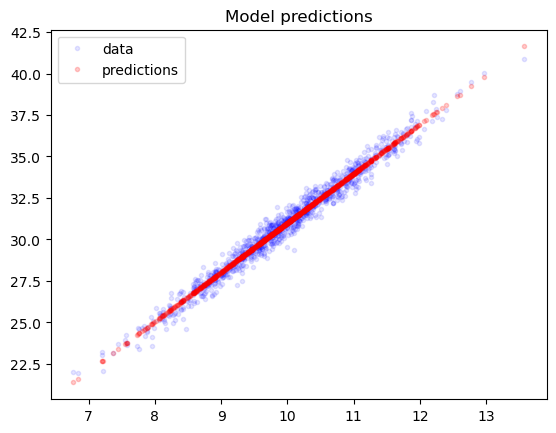

In [16]:
plt.plot(X[:,0], y, "b.", alpha=0.1, label="data")
plt.plot(X[:,0], y_pred, "r.", alpha=0.2, label="predictions")
plt.legend()
plt.title("Model predictions")
plt.savefig(f'{folderpath}default_model_500e_training_loss.png')
plt.show()

Let's look at the weights and the global model:

In [17]:
model.weights

array([[21.37684658],
       [20.25403527]])

As we have normalized $X$ with the min-max method, we have now to do this transformation:

$$
\begin{align*}
    \tilde m \, X + \tilde b & = w_1 \, X_{\text{normalized}} + w_0\\
                             & = w_1 \, \frac{X - min(X)}{max(X) - min(X)} + w_0\\
                             & = (w_1 \frac{1}{max(X) - min(X)}) \, X + (w_0 - w_1 \, \frac{min(X)}{max(X) - min(X)})
\end{align*}
$$ 

Then the estimate of $m$ is:

In [18]:
m = model.weights[1][0]*1/(max_values[0]-min_values[0])
m

2.9773812021533588

And the estimate of $b$ is:

In [19]:
b = model.weights[0][0] - model.weights[1][0]*min_values[0]/(max_values[0]-min_values[0])
b

1.2231170013767318

The estimates are not perfect but we have to remember we add some noise in $y$, then it may be the best we can do.

Let's try to fit a linear regression model:

In [20]:
from sklearn.linear_model import LinearRegression
reg = LinearRegression().fit(X_normalized, y)
reg.coef_[0], reg.intercept_

(20.306045873199857, 21.358816204265782)

As we did it earlier, we have to adapt these values due to the min-max normalization:

In [21]:
m = reg.coef_[0]*1/(max_values[0]-min_values[0])
b = reg.intercept_ - reg.coef_[0]*min_values[0]/(max_values[0]-min_values[0])
print(f"linear regression: m={m}, b={b}")

linear regression: m=2.9850268585295194, b=1.1533335989960456


These results are slightly better but we can see that getting closer seems to be hard.

By generating more data and training our model through more epochs we surely get more accurate results.

Here is a quick illustration:

In [22]:
X2 = np.random.normal(10, 1, size=(10**5, m_features))

y2 = f(X2).flatten()
noise2 = np.random.normal(0, 0.5, size=10**5)
y2 += noise2

In [23]:
min_values2 = X2.min(axis=0)
max_values2 = X2.max(axis=0)
X2_normalized = (X2 - min_values2)/(max_values2 - min_values2)

In [24]:
model2 = SingleNeuronMLP(learning_rate=0.01, activation="linear")
model2.compile(loss="mean_squared_error")
model2.fit(X2_normalized, y2, epochs=500, batch_size=32, random_state=seed, verbose=1)

Epoch 500/500 - 3125/3125 - loss=0.24784715590975492 - score=0.24785749289256276

The resulting parameters:

In [25]:
m2 = model2.weights[1][0]*1/(max_values2[0]-min_values2[0])
m2

3.002336109012091

In [26]:
b2 = model2.weights[0][0] - model2.weights[1][0]*min_values2[0]/(max_values2[0]-min_values2[0])
b2

0.9665211207693858

### 2. Hyper-parameters tuning

Let's now analyze the effects of the hyper-parameters on the model.

We are going to study two main parameters: the **learning rate** and the **batch size**.

#### 2.1. Learning Rate

As introduced earlier, the learning rate is the fraction of the gradient you want to keep to update the weights.

The gradient gives a direction and a strength for the update of weights, by choosig a low learning rate you want the model to learn slower and a high one will make it learn faster.

This is the reason why the SGD method is not usually chosen as an optimizer, you'll have to tune this parameter to get the best results. 
And even by tuning it, you could not reach the optimal one because of it's a constant.
Some variants exist where the learning rate depends on the current state of the training (the epoch number) allowing the model to learn faster at the begining (search a good "area" where to search the optimal weights) and slower at the end in order to be the more accurate as possible.

Let's choose different learning rates and see what happens on the training:

In [27]:
learning_rate_list = [0.005, 0.01, 0.02, 0.05, 0.1]

In [28]:
losses_list, weights_list, weights_init_list = [], [], []
for i, learning_rate in enumerate(learning_rate_list):
    model = SingleNeuronMLP(learning_rate=learning_rate, activation="linear")
    model.compile(loss="mean_squared_error")
    model.fit(X_normalized, y, epochs=500, batch_size=32, random_state=seed, verbose=0)
    losses_list.append(model.training_results["losses"])
    weights_list.append(model.training_results["weights"])
    weights_init_list.append(model.training_results["weights_init"])
    print(f"\r{i+1}/{len(learning_rate_list)}", end="")

5/5

In [29]:
colors = ["black", "gray", "purple", "blue", "green"]

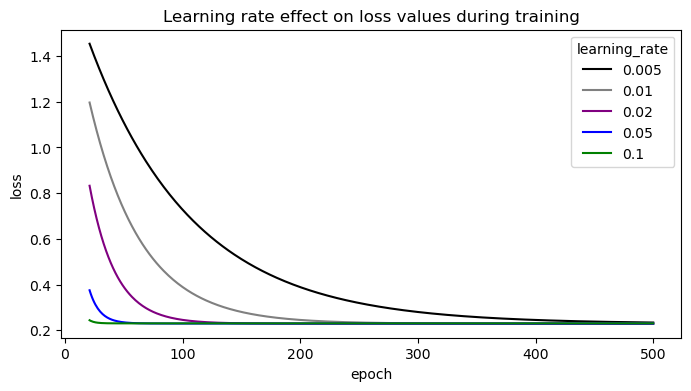

In [30]:
plt.figure(figsize=(8,4))
first_epoch, last_epoch = 20, 500
for i in range(len(learning_rate_list)):
    plt.plot(
        range(1,500+1)[first_epoch:last_epoch], 
        losses_list[i][first_epoch:last_epoch], 
        c=colors[i], label = learning_rate_list[i]
    )
plt.legend(title="learning_rate")
plt.xlabel("epoch")
plt.ylabel("loss")
plt.title("Learning rate effect on loss values during training")
plt.savefig(f'{folderpath}lr_effect_training_loss.png')
plt.show()

I took the losses starting from the 20-th epoch for clarity because the first losses were too large.

As you can see, at the end of the training they all get a loss around 0.2. But they are faster to reach this value when they have a higher learning rate.

Let's look closer at the end of the training:

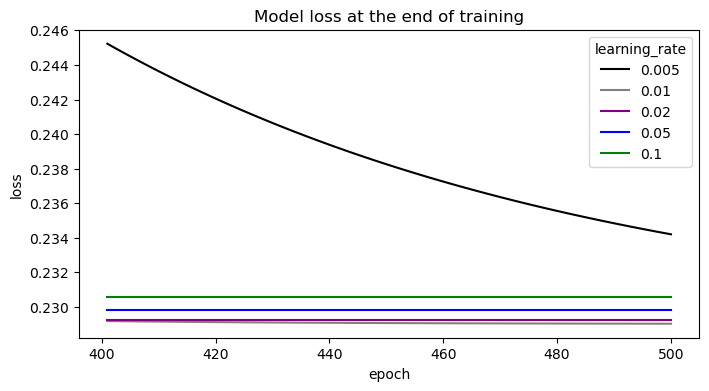

In [31]:
plt.figure(figsize=(8,4))
first_epoch, last_epoch = 400, 500
for i in range(len(learning_rate_list)):
    plt.plot(
        range(1,500+1)[first_epoch:last_epoch], 
        losses_list[i][first_epoch:last_epoch], 
        c=colors[i], label = learning_rate_list[i]
    )
plt.legend(title="learning_rate")
plt.xlabel("epoch")
plt.ylabel("loss")
plt.title("Model loss at the end of training")
plt.savefig(f'{folderpath}lr_effect_training_loss_end.png')
plt.show()

You can see that most of the models have converged (except for the one with a 0.005 learning rate).
Which means that they won't learn anymore even if you increase the number of epochs.

Something interesting to note here is that the models that perform the better are those with a lower learning rate: 0.01 is better than 0.02, which is better than 0.05 which is better than 0.1. 
But the 0.005 is the worst! Actually we could guess that with more epochs, 0.005 will at least reach the loss that 0.01 got.

So, setting a higher learning rate will accelerate the training (you'll need less epochs to converge) but you will be less accurate at the end.

This parameter is the way you'll handle the trade-off training time vs accuracy.

Here is a visualization of the updates of weights ($w_0$, $w_1$) for each model.

The initialization (starting point) of weights are displayed with a `+`:

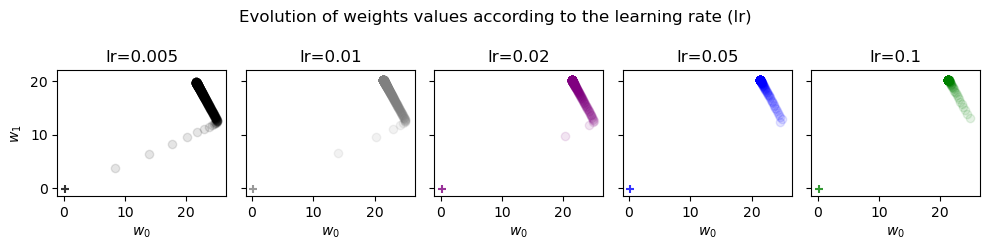

In [32]:
fig, axs = plt.subplots(nrows=1,ncols=5, figsize=(10,2.5), sharey=True)
for i in range(5):
    # weights init
    axs[i].scatter(weights_init_list[i][0][0],
                   weights_init_list[i][1][0],
                   color=colors[i],marker="+", alpha=0.8)
    
    axs[i].scatter(np.array(weights_list[i]).reshape(500,2)[:,0], 
                np.array(weights_list[i]).reshape(500,2)[:,1], 
                color=colors[i], alpha=0.1)
    axs[i].set_title(f"lr={learning_rate_list[i]}")
    axs[i].set_xlim([-1,26.5])
    axs[i].set_ylim([-1.5,22])
    if i == 0:
        axs[i].set_ylabel("$w_1$")
    axs[i].set_xlabel("$w_0$")
fig.suptitle("Evolution of weights values according to the learning rate (lr)", fontsize=12)
plt.tight_layout()
plt.savefig(f'{folderpath}weights_evolution_lr.png')
plt.show()

You can see that the smaller the learning rate is, the smaller are the distances between the updates of the weights.

Below are the models for four distinct steps of the training: the 1st epoch, the 10th, the 100th and the 500th.
    
They are split according to their learning rate as above:

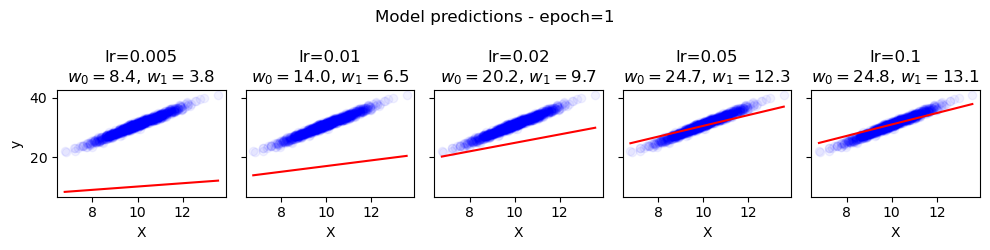

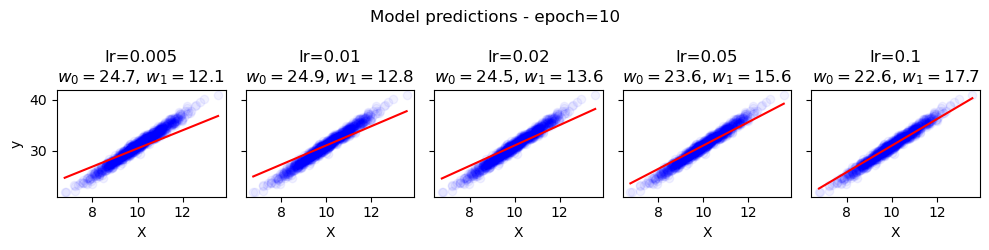

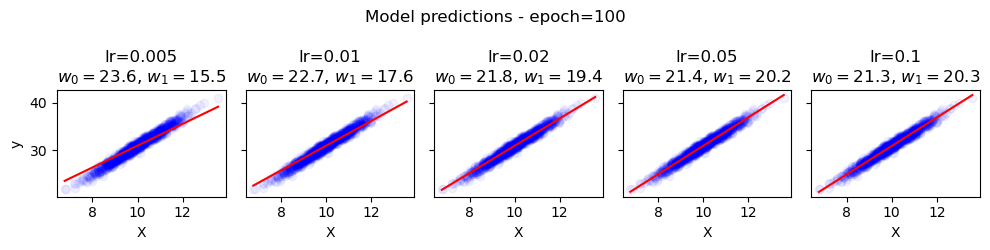

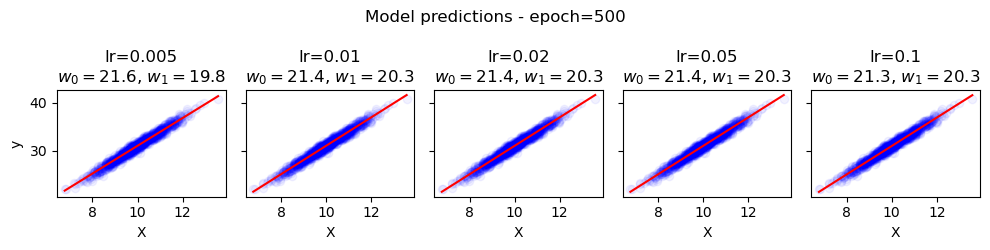

In [33]:
for j in [0, 9, 99, 499]:
    fig, axs = plt.subplots(nrows=1,ncols=5, figsize=(10,2.5), sharey=True)
    x_range = np.linspace(min_values[0], max_values[0], 100)
    x_norm_range = np.linspace(0, 1, 100)
    for i in range(5):
        axs[i].scatter(X[:,0], y, color="blue", alpha=0.05)
        w0, w1 = np.array(weights_list[i]).reshape(500,2)[j,0], np.array(weights_list[i]).reshape(500,2)[j,1]
        axs[i].plot(x_range,  w1*x_norm_range + w0, color="red")

        axs[i].set_title(f"lr={learning_rate_list[i]}\n$w_0={np.round(w0,1)}$, $w_1={np.round(w1,1)}$")
        axs[i].set_xlabel("X")
        if i == 0:
            axs[i].set_ylabel("y")
    fig.suptitle(f'Model predictions - epoch={j+1}', fontsize=12)
    plt.tight_layout()
    plt.savefig(f'{folderpath}lr_effect_model_predictions_e{j+1}.png')
    plt.show()

At the first epoch you can see that the models with 0.1 and 0.05 learning rates are already close to a good approximation, the others are only getting slowly closer.

At the 100th epoch they are almost well fitted but for the 0.005 one.

And at the end, all the weights are pretty close and you can see that the model with a 0.1 learning_rate has a slightly different $w_0$ weight: $21.3$ whereas the others have a $w_0=21.4$.

The reason is that the learning rate is too large to move accurately to this value.

Below is a gif illustrating the evolution through the epochs:

In [34]:
from generate_gif import generate_learning_rate_gif
generate_learning_rate_gif(
    X, y, learning_rate_list, weights_list, 
    weights_init_list, min_values, max_values, 
    folderpath="plot/lr/")

images generation
500/500
gif creation: ok


In [35]:
from IPython.display import Image
from IPython.core.display import display

C:\Users\vanna\AppData\Local\Temp\ipykernel_12684\709795144.py:2: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display


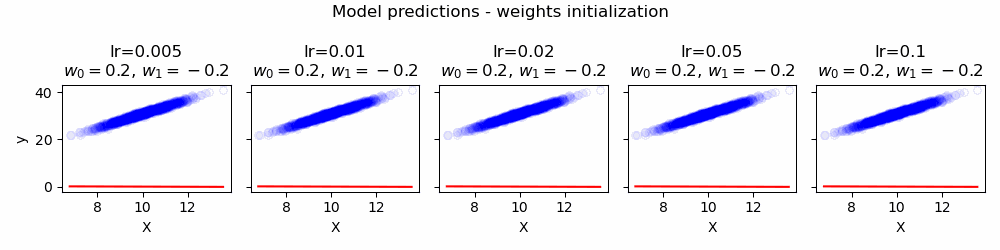

In [36]:
display(Image(filename="plot/lr/"+"animated_plot.gif"))

0.01 and 0.02 seem to be good values with our settings but we have set the batch size at 32 by default.

Let's take a look at how it affects the model training too.

#### 2.2. Batch Size

The batch size refers to the number of training examples used in one iteration of training. Instead of updating the model's weights after each individual example (`batch_size=1`), the model updates its weights after processing a batch of examples.

This can be seen as a training accelerator. 
The more training examples you use to update the model's weights, the more stable and reliable the gradient estimates become. 
However, larger batch sizes require more memory and computational resources. 
There is a trade-off between batch size and training speed: smaller batch sizes provide noisier updates but allow for more frequent weight updates, while larger batch sizes provide more accurate updates but are computationally more intensive and may slow down the training process.

Choosing the right batch size is crucial for achieving efficient and effective training. 
It often involves balancing between computation efficiency, memory constraints, and the stability of the training process.

In our case we are training the models with few data (1000) so this won't be really clear and even a batch size of 1000 won't take that long.
But for a dataset of 1,000,000 training examples with 1,000 features, trying to train a model with a batch size of 100,000 could bring to a memory issue.
The difference between a batch size of 1 and another of 32 is then almost negligible.
But anyway, it is important in all cases to try different values and adapt your model according to your context.

Let's choose different batch size and see what happens on the training:

In [37]:
batch_size_list = [1, 16, 32, 256, 1000]

In [38]:
losses_list, weights_list, batch_weights_list, weights_init_list, batch_indexes_list = [], [], [], [], []
for i, batch_size in enumerate(batch_size_list):
    model = SingleNeuronMLP(learning_rate=0.01, activation="linear")
    model.compile(loss="mean_squared_error")
    model.fit(X_normalized, y, epochs=500, batch_size=batch_size, batch_details=True, random_state=seed, verbose=0)
    losses_list.append(model.training_results["losses"])
    weights_list.append(model.training_results["weights"])
    weights_init_list.append(model.training_results["weights_init"])
    batch_weights_list.append(model.training_results["batch_weights"])
    batch_indexes_list.append(model.training_results["batch_indexes"])
    print(f"\r{i+1}/{len(learning_rate_list)}", end="")

5/5

In [39]:
colors = ["black", "gray", "purple", "blue", "green"]

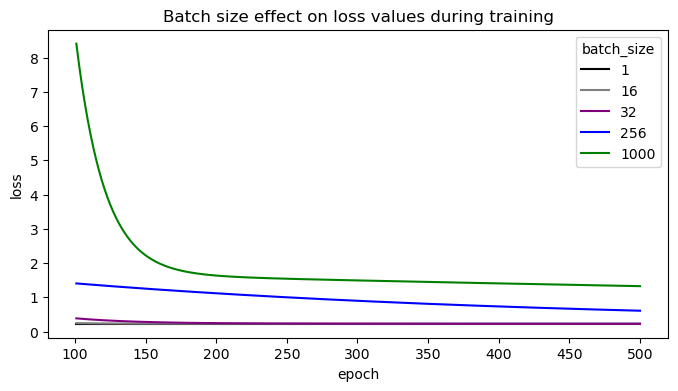

In [40]:
plt.figure(figsize=(8,4))
first_epoch, last_epoch = 100, 500
for i in range(len(batch_size_list)):
    plt.plot(
        range(1,500+1)[first_epoch:last_epoch], 
        losses_list[i][first_epoch:last_epoch], 
        c=colors[i], label = batch_size_list[i]
    )
plt.legend(title="batch_size")
plt.xlabel("epoch")
plt.ylabel("loss")
plt.title("Batch size effect on loss values during training")
plt.savefig(f'{folderpath}bs_effect_training_loss.png')
plt.show()

The same way as with learning rates, they all get a loss value around 0.2 but for the 256 and 1000 batch sizes.
The small batch sizes converge faster and as you inscrease it, the model is getting slower to learn.

Let's look closer at the end of the training:

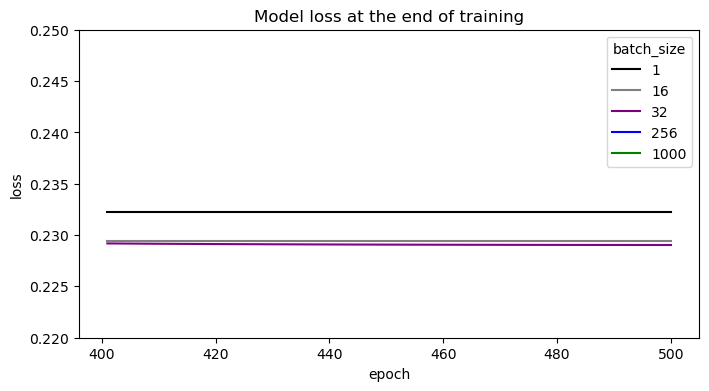

In [41]:
plt.figure(figsize=(8,4))
first_epoch, last_epoch = 400, 500
for i in range(len(batch_size_list)):
    plt.plot(
        range(1,500+1)[first_epoch:last_epoch], 
        losses_list[i][first_epoch:last_epoch], 
        c=colors[i], label = batch_size_list[i]
    )
plt.legend(title="batch_size")
plt.xlabel("epoch")
plt.ylabel("loss")
plt.ylim([0.22,0.25])
plt.title("Model loss at the end of training")
plt.savefig(f'{folderpath}bs_effect_training_loss_end.png')
plt.show()

We can see a similar phenomenon as we have seen with learning rates: the batch size of 1 which was the faster to converge seems to be stuck and not be able to learn further.

On the other side, the 16 and 32 batch sizes were slower but they found better weights and then a better loss (you can note that the model with a batch size of 32 is still improving a the end of the training, it may improve even more if you train it through more epochs).

Let's now pass to the movement of the weights:

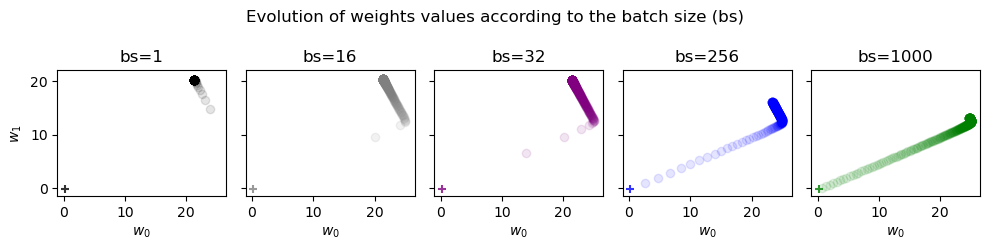

In [42]:
fig, axs = plt.subplots(nrows=1,ncols=5, figsize=(10,2.5), sharey=True)
for i in range(5):
    # weights init
    axs[i].scatter(weights_init_list[i][0][0],
                   weights_init_list[i][1][0],
                   color=colors[i],marker="+", alpha=0.8)
    
    axs[i].scatter(np.array(weights_list[i]).reshape(500,2)[:,0], 
                np.array(weights_list[i]).reshape(500,2)[:,1], 
                color=colors[i], alpha=0.1)
    axs[i].set_title(f"bs={batch_size_list[i]}")
    axs[i].set_xlim([-1,26.5])
    axs[i].set_ylim([-1.5,22])
    if i == 0:
        axs[i].set_ylabel("$w_1$")
    axs[i].set_xlabel("$w_0$")
fig.suptitle("Evolution of weights values according to the batch size (bs)", fontsize=12)
plt.tight_layout()
plt.savefig(f'{folderpath}weights_evolution_bs.png')
plt.show()

The larger the batch size is, the smaller are the distances between weights updates.

Below the same visualization as we did with learning rates:

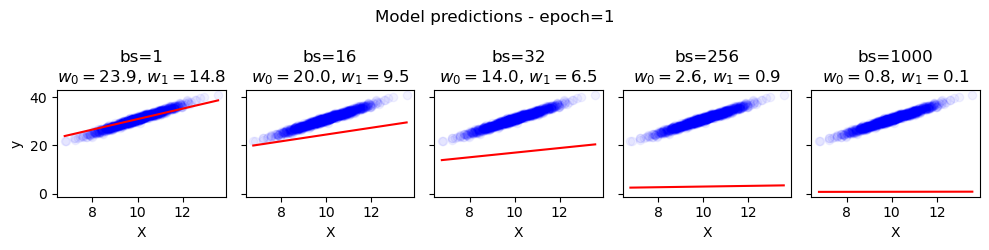

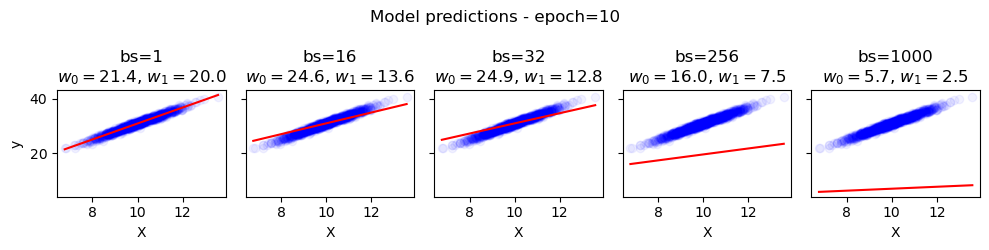

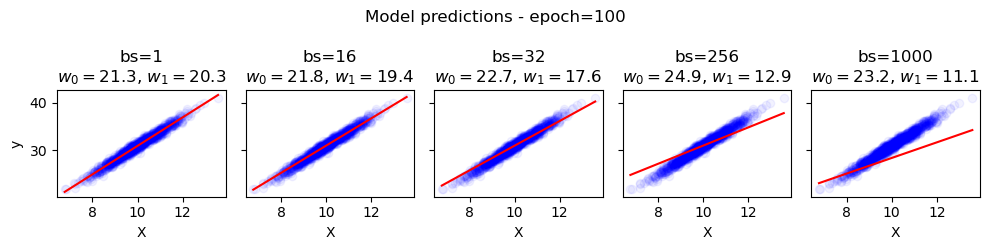

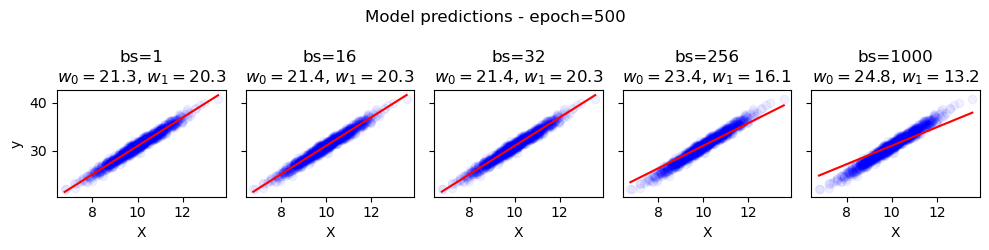

In [43]:
for j in [0, 9, 99, 499]:
    fig, axs = plt.subplots(nrows=1,ncols=5, figsize=(10,2.5), sharey=True)
    x_range = np.linspace(min_values[0], max_values[0], 100)
    x_norm_range = np.linspace(0, 1, 100)
    for i in range(5):
        axs[i].scatter(X[:,0], y, color="blue", alpha=0.05)
        w0, w1 = np.array(weights_list[i]).reshape(500,2)[j,0], np.array(weights_list[i]).reshape(500,2)[j,1]
        axs[i].plot(x_range,  w1*x_norm_range + w0, color="red")

        axs[i].set_title(f"bs={batch_size_list[i]}\n$w_0={np.round(w0,1)}$, $w_1={np.round(w1,1)}$")
        #axs[i].set_xlim([-1,26.5])
        #axs[i].set_ylim([-1.5,22])
        axs[i].set_xlabel("X")
        if i == 0:
            axs[i].set_ylabel("y")
    fig.suptitle(f'Model predictions - epoch={j+1}', fontsize=12)
    plt.tight_layout()
    plt.savefig(f'{folderpath}bs_effect_model_predictions_e{j+1}.png')
    plt.show()

Here again you can see similar results.

We could say that a large batch size (relative to the dataset size) has a similar effect as a low learning rate.

A batch size of 1 behaves similarly to using a learning rate of 0.1: it converges earlier and got less accurate weights ompared to batch sizes of 16 and 32 (which bring the best values here).

Batch sizes of 256 and 1000 prevent the model from converging within 500 epochs.

Below is a gif illustrating the evolution through the epochs:

In [45]:
from generate_gif import generate_batch_size_gif
generate_batch_size_gif(
    X, y, batch_size_list, weights_list, 
    weights_init_list, min_values, max_values, 
    folderpath="plot/bs/")

images generation
500/500
gif creation: ok


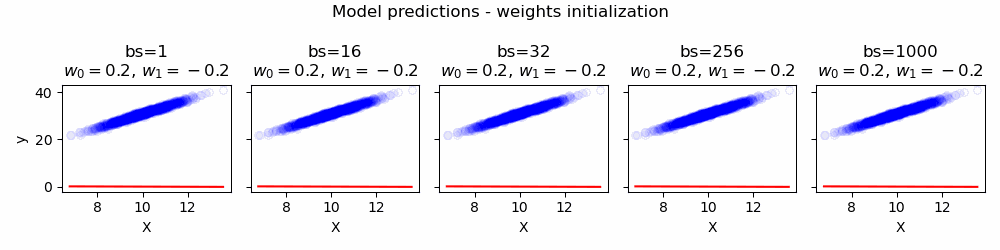

In [46]:
display(Image(filename="plot/bs/"+"animated_plot.gif"))

Another interesting thing could be to watch the evolution of the model training through each batch step.

Here is a gif showing the evolution of the model at each batch through a set of epochs:

In [47]:
from generate_gif import generate_batch_size_steps_gif
generate_batch_size_steps_gif(
    X, y, 1, batch_size_list, batch_indexes_list, batch_weights_list, 
    weights_init_list, min_values, max_values, epochs=[0, 1, 2, 9, 19, 99],
    folderpath="plot/bs16_steps/")

images generation
epoch=6/6, batch=63/63 / images=757/757     
gif creation: ok


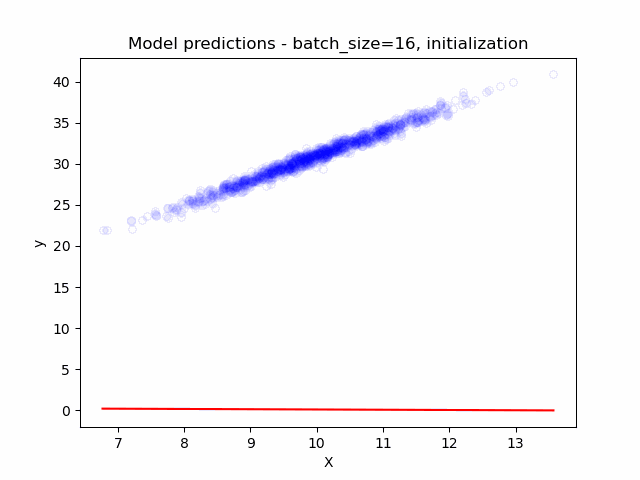

In [48]:
display(Image(filename="plot/bs16_steps/"+"animated_plot.gif"))

So, a good batch size could be 16 or 32 or maybe a bit larger.

But we set learning rate at 0.01 according to the first part and we don't know if we could have had better results with other combinations: this leads us to grid search part.

#### 2.3. Grid Search

To find the optimal parameters, it'ss better to search for the best loss across a set of parameter combinations.

To achieve this, we will use the grid search method. This method computes the loss for each combination and identifies the best one. However, be mindful of the number of parameters and the number of values per parameter you want to test. If there are too many, the search will be very time-consuming.

For example, if you want to find the best combination of two parameters, each with 5 values, you will need to train $5^2=25$ models. Now, if you want to test 5 parameters, each with 4 values, you will need to train $4^5=1024$ models!

To calculate the number of combinations, simply multiply the number of values for each parameter.

Let's search the best (learning rate, batch size) combination through these sets of values:

In [49]:
learning_rates = np.arange(0.01, 0.1+0.005, 0.005).tolist()
batch_sizes = [2, 4, 8, 16, 32, 46, 64, 84, 104, 128]
print(f"combinations number={len(learning_rates)*len(batch_sizes)}")

combinations number=200


In [50]:
grid_search = np.empty((len(learning_rates)*len(batch_sizes), 3))
n_combinations = grid_search.shape[0]
cpt = 0
for learning_rate in learning_rates:
    for batch_size in batch_sizes:
        print(f"{cpt+1}/{n_combinations} - learning_rate={learning_rate}, batch_size={batch_size}", end="")
        model = SingleNeuronMLP(learning_rate=learning_rate, activation="linear")
        model.compile(loss="mean_squared_error")
        model.fit(
            X_normalized, y, epochs=500, batch_size=batch_size, random_state=seed, verbose=0)
        score = model.training_results["scores"][-1]
        grid_search[cpt,:] = [learning_rate, batch_size, score]
        print(f"\r{cpt+1}/{n_combinations} - learning_rate={learning_rate}, batch_size={batch_size} - score={score}")
        cpt += 1

1/200 - learning_rate=0.01, batch_size=2 - score=0.22922638535548384
2/200 - learning_rate=0.01, batch_size=4 - score=0.2293469064053808
3/200 - learning_rate=0.01, batch_size=8 - score=0.22927759137853998
4/200 - learning_rate=0.01, batch_size=16 - score=0.22922247336034635
5/200 - learning_rate=0.01, batch_size=32 - score=0.22932016228343788
6/200 - learning_rate=0.01, batch_size=46 - score=0.22991581113406123
7/200 - learning_rate=0.01, batch_size=64 - score=0.23511861994063804
8/200 - learning_rate=0.01, batch_size=84 - score=0.25176161742422437
9/200 - learning_rate=0.01, batch_size=104 - score=0.27700515895430855
10/200 - learning_rate=0.01, batch_size=128 - score=0.3230190463727768
11/200 - learning_rate=0.015, batch_size=2 - score=0.22962833758094434
12/200 - learning_rate=0.015, batch_size=4 - score=0.22930248575998488
13/200 - learning_rate=0.015, batch_size=8 - score=0.22932028122736953
14/200 - learning_rate=0.015, batch_size=16 - score=0.22922264291386485
15/200 - learning

To get the best parameters we just have to search lowest loss:

In [51]:
min_loss_index = np.argmin(grid_search[:,2])
min_loss_index

62

In [52]:
grid_search[min_loss_index,:]

array([0.04      , 8.        , 0.22922111])

In [53]:
best_learning_rate, best_batch_size = grid_search[min_loss_index,:2]
best_learning_rate, best_batch_size

(0.039999999999999994, 8.0)

According to this search (that could be extended in wider ranges), the best parameters are a 0.04 learning rate and a batch size of 8.

Let's now visualize the results in a 3D space: 
* the x axis is the learning rate,
* the y axis the batch size
* and the z axis is the loss (and the color as well)

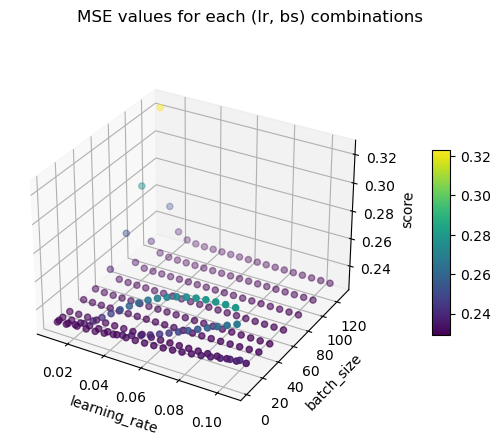

In [54]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
p = ax.scatter(grid_search[:,0], grid_search[:,1], grid_search[:,2], 
               c=grid_search[:,2], cmap="viridis")      
ax.set_xlabel('learning_rate')
ax.set_ylabel('batch_size')
ax.set_zlabel('score')
fig.colorbar(p, shrink=0.5, aspect=10, pad=0.12)
fig.suptitle("MSE values for each (lr, bs) combinations", fontsize=12)
plt.savefig(f'{folderpath}gridsearch_3d_plot1.png')
plt.show()

Here's another point of view:

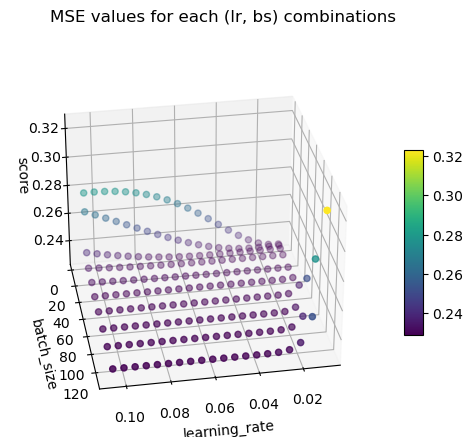

In [55]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
p = ax.scatter(
    grid_search[:,0], grid_search[:,1], grid_search[:,2], 
    c=grid_search[:,2], cmap="viridis")      
ax.set_xlabel('learning_rate')
ax.set_ylabel('batch_size')
ax.set_zlabel('score')
fig.colorbar(p, shrink=0.5, aspect=10, pad=0.05)
ax.view_init(elev=30, azim=80)
fig.suptitle("MSE values for each (lr, bs) combinations", fontsize=12)
plt.savefig(f'{folderpath}gridsearch_3d_plot2.png')
plt.show()

Most of the combinations resulted in good loss values, but some combinations led to poor outcomes.

First, the model trained with a low learning rate and large batch sizes shows a peak resulting in a yellow point. This combination does not seem to work well in our case.

Another problematic combination is a small batch size paired with high learning rates, as shown in the second chart, which looks like a wave.

Note that the best combination is close to the second case: learning rate = 0.04 and a batch size = 8.
    
But as we can see on the chart, they are all pretty close to a loss value we could not really improve.

#### Summary

Let's summarize what we've learned:

* learning rate
    - high learning rate makes a model converge faster but the results won't be the most accuracte
    - low learning rate makes the model more accurate but the training takes more time
* batch size
    - small batch size makes a model converge faster but the results won't be the most accurate
    - large batch size makes the model more accurate but the training takes more time
* grid search
    - avoid low learning rates with large batch sizes
    - avoid high learning rates with small batch sizes
    - the best combination is a learning rate = 0.04 and a batch size = 8

### 3. Optimized Model

Let's train a model with the best parameters through more epoch and see if we can improve its performances:

In [56]:
model = SingleNeuronMLP(learning_rate=0.04, activation="linear")
model.compile(loss="mean_squared_error")
model.fit(X_normalized, y, epochs=4000, batch_size=8, random_state=seed, verbose=0)

In [57]:
model.training_results["scores"][-1]

0.22922110722413744

We can compare our results with the perfect model we could have.
Perfect because we know the underlying law: the $f$ function we defined at the begining.
But in practice we won't know it, otherwise we would not have needed to build a model!

Let's look at the loss (MSE) we would have with the perfect model:

In [58]:
model.loss_function(y, f(X).flatten())

0.22946317146835007

Surprisingly, the loss is slightly higher than the one found by our optimized model! Did our model overfit? I would say "kind of". With only 1000 training examples, it might have learned some of the noise. However, since the model contains only 2 parameters, this limits its capacity to overfit.

Overfitting is a problem you would have to care about when you'll work on more complex models, for example with a neural network with more than one layer. You'll also need to split your data into a training and validation set to avoid it, to process cross validation while trying to find the best hyperparameters, and so on. 

A lot of things to learn in the world of Machine Learning!

---

I hope you have enjoyed! and thanks for reading :)